In [1]:
%load_ext rpy2.ipython
%R library(dplyr); library(ggplot2)

group="group4"
group_number="4"
import os
#os.chdir("../")
prelim_groups=open("phage_by_group.txt")
phage_grp={}
for line in prelim_groups.readlines():
    line=line.rstrip("\n")
    vec=line.split("\t")
    phage_grp[vec[0]]=vec[1]
groups=list(phage_grp.values())
unique=[]
for value in groups:
    if value not in unique:
        unique.append(value)
grouplist=[]
for value in phage_grp.keys():
    if phage_grp.get(value)=='CNSv2.0:'+group_number:
        grouplist.append(value)
print(grouplist)
os.chdir("./"+group)

['1.237.B.', '1.267.O.', '1.196.O.', '1.195.O.', '1.277.A.', '1.104.O.', '1.271.B.', '1.118.B.', '1.200.O.', '1.281.O.', '1.012.O.', '1.194.O.', '1.269.O.', '1.027.O.', '1.046.O.', '1.250.O.', '1.272.O.', '1.270.B.', '1.089.O.', '1.088.O.', '1.274.O.', '1.271.A.', '1.023.O.', '1.171.O.', '1.277.B.', '1.103.O.', '1.022.O.', '1.251.O.', '1.268.A.', '1.024.O.', '1.160.O.', '1.118.A.', '1.280.O.', '1.283.A.', '1.283.C.', '1.237.A.', '1.270.A.', '1.098.O.', '1.032.O.', '1.268.B.', '1.283.B.', '1.285.O.', '1.282.A.', '1.033.O.']


//anaconda/lib/python2.7/site-packages/rpy2/robjects/functions.py:106: UserWarning: 
Attaching package: ‘dplyr’


  res = super(Function, self).__call__(*new_args, **new_kwargs)
//anaconda/lib/python2.7/site-packages/rpy2/robjects/functions.py:106: UserWarning: The following objects are masked from ‘package:stats’:

    filter, lag


  res = super(Function, self).__call__(*new_args, **new_kwargs)
//anaconda/lib/python2.7/site-packages/rpy2/robjects/functions.py:106: UserWarning: The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


  res = super(Function, self).__call__(*new_args, **new_kwargs)


In [ ]:
step1c1=open("step1.contig1.sh","w")
step1c1.write("#!/bin/bash\n#SBATCH -n 16\n#SBATCH -N 1\n#SBATCH -o s1c1.out\n#SBATCH -e s1c1.err\n#SBATCH -p sched_mit_chisholm\n\n")
step1c1.write("module add engaging/clc-assembly-cell\nmodule add engaging/samtools/1.1\nmodule add engaging/bedtools/2.22.1\n\n")
for line in grouplist:
    name=line.rstrip("\n")
    step1c1.write("\n\n#"+name+"\nclc_assembler -o "+name+"step1.clc.fasta -m 500 -p fb ss 100 300 -q ../"+ name+"*.fastq\n")
    step1c1.write("samtools faidx "+name+"step1.clc.fasta 'contig_1'>"+name+"step1.contig1.fasta\n\nclc_mapper -o "+name+"step1.contig1.cas -p fb ss 100 300 -q ../"+name+"*.fastq -d "+name+"step1.contig1.fasta -a local -r ignore\n")
    step1c1.write("clc_cas_to_sam -a "+name+"step1.contig1.cas -o "+name+"step1.contig1.bam\n\nsamtools sort "+name+"step1.contig1.bam "+name+"sorted.step1.contig1\nsamtools index "+name+"sorted.step1.contig1.bam\n\nbedtools genomecov -ibam "+name+"sorted.step1.contig1.bam -d > "+name+"step1.contig1.genomecoverage.txt\n\n")
step1c1.close()
!open step1.contig1.sh -a textedit

In [ ]:
!scp step1.contig1.sh jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group14/

In [ ]:
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group14/*genomecoverage* ./

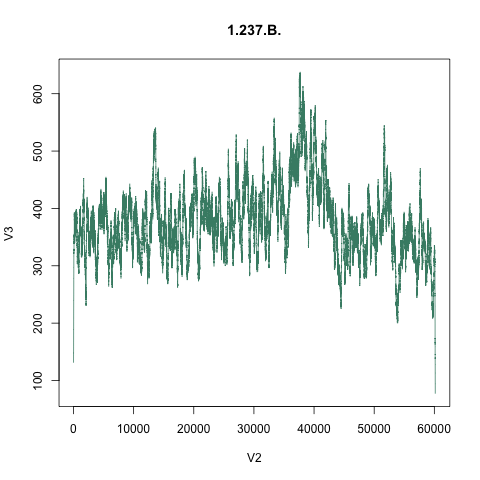

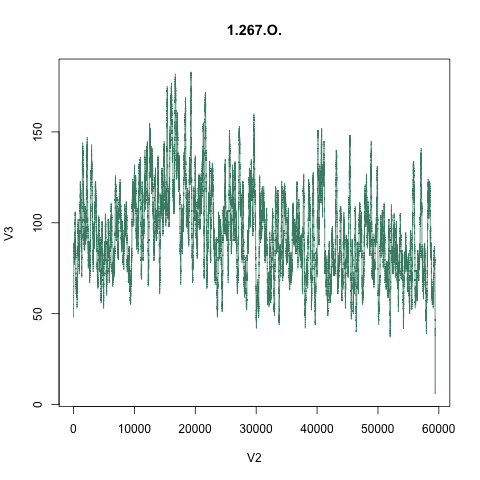

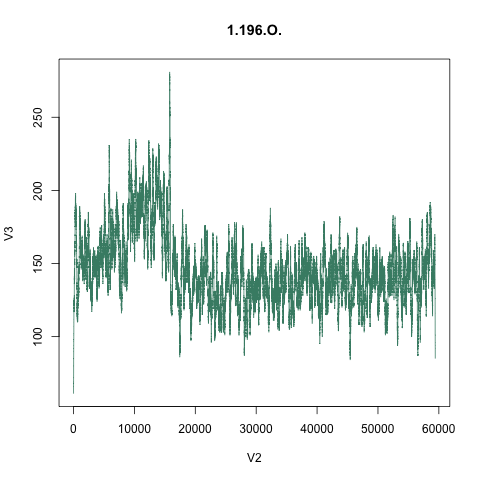

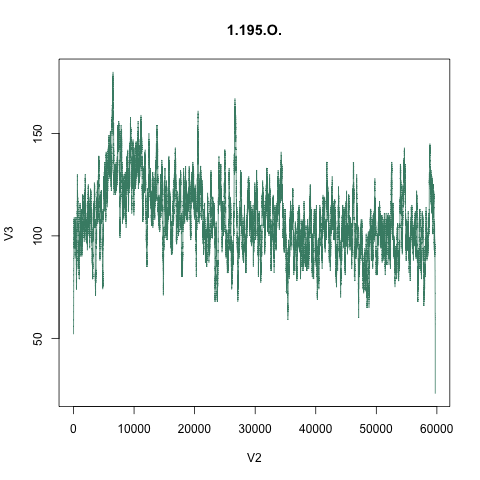

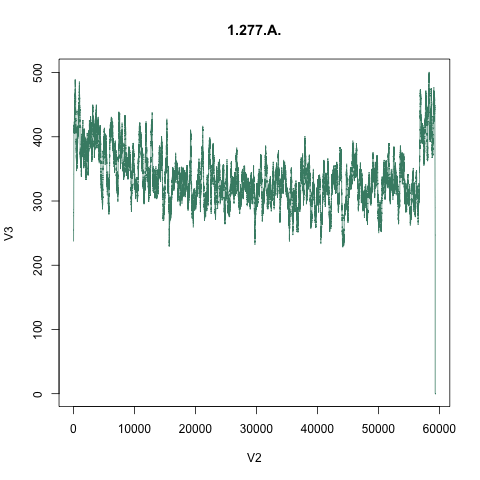

...

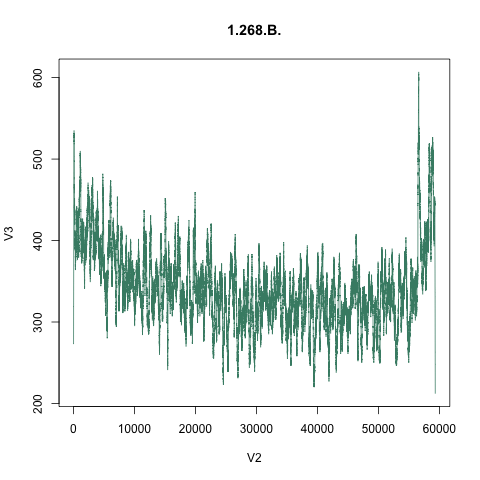

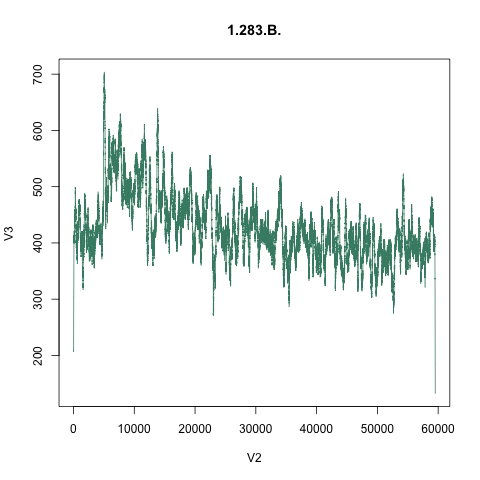

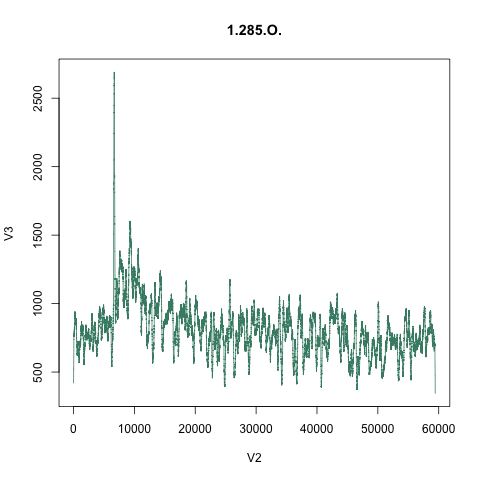

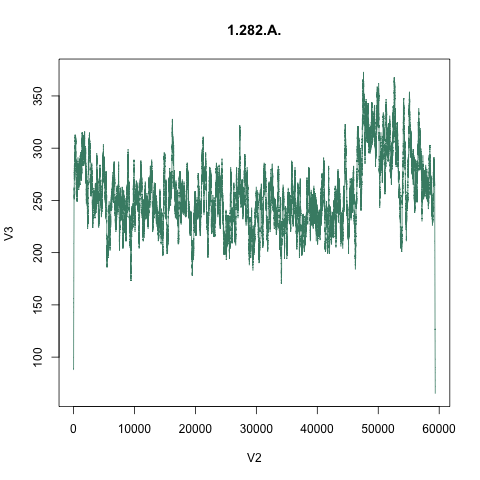

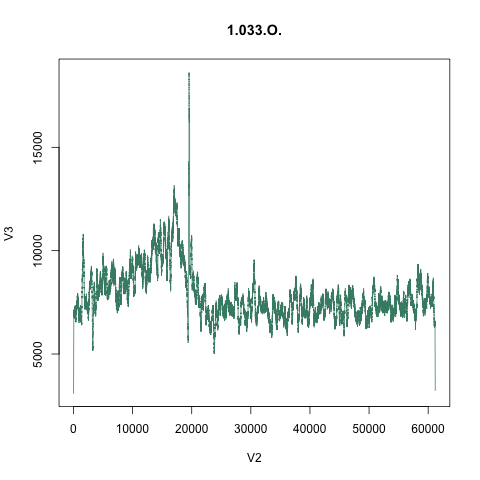

In [2]:
%%R -i grouplist

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    coverage<-read.table(filename, sep="\t")
    with(coverage, plot(V2, V3, type="l", col="aquamarine4", cex=2, main=item))
}

In [2]:
from pyfaidx import Fasta

contiginfo="virname\tcontig\tcontig_len\tvir_contig\n"
for phage in grouplist:   #set up the name of the virus
    fasta1=phage+"step1.contig1.fasta"
    f=Fasta(fasta1)
    for seq in f.keys():
        seqlen=len(str(f[seq]))
        contigname=seq
        contiginfo+=(phage+"\t"+contigname+"\t"+str(seqlen)+"\t"+phage+":"+contigname+"\n")
        

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  58890   59300   59530   59890   60170   62500 


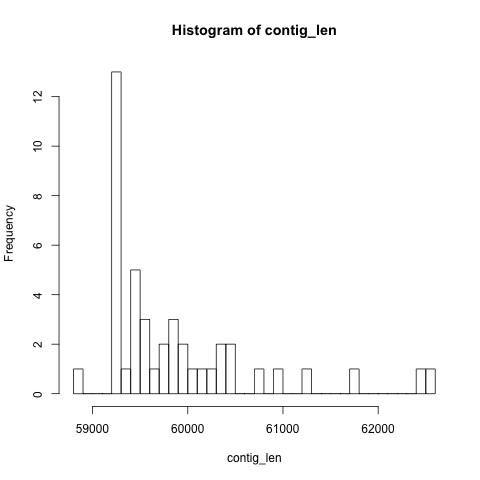

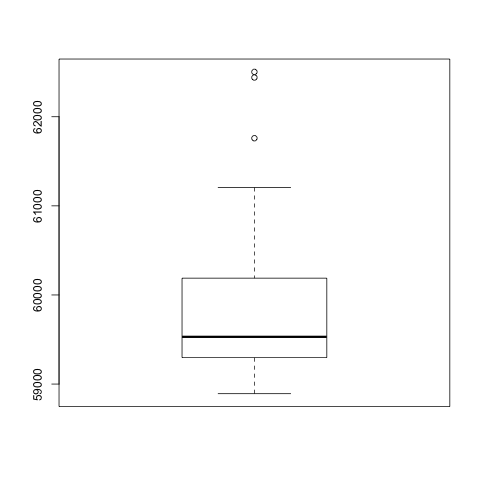

In [3]:
%%R -i contiginfo
contig<-textConnection(contiginfo,open="r",encoding="UTF-8")
contigtable<-read.table(contig, sep="\t", header=TRUE)
#?textConnection

with(contigtable, hist(contig_len, breaks=50))
with(contigtable, boxplot(contig_len))
with(contigtable, summary(contig_len))

[1] "there are 0 mu-like phages; 0 cos-like phages; 1 small internal peak phages;"
[1] "there are 5 long terminal repeat phages; 0 phages with multiple peaks; 29 headful phages;"
[1] "and 9 phages with even genome coverage; and 0 phages with no determined pattern"


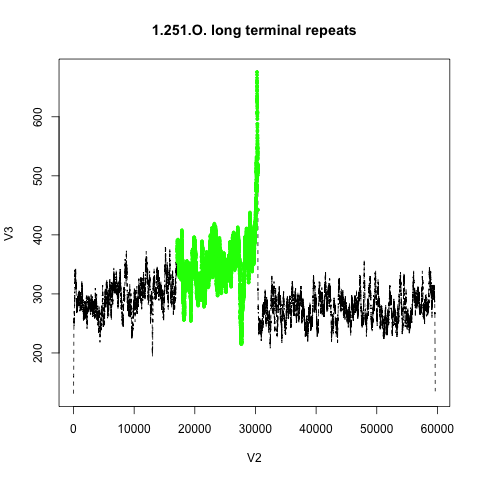

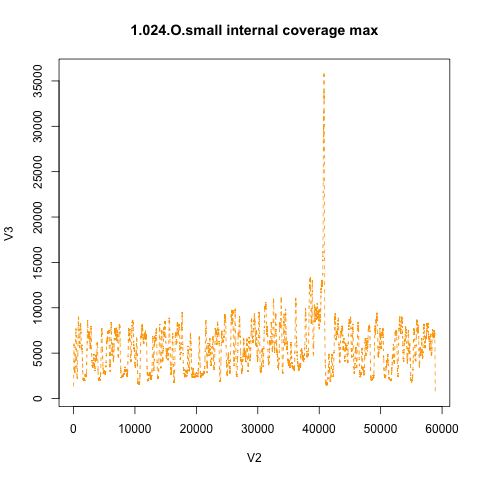

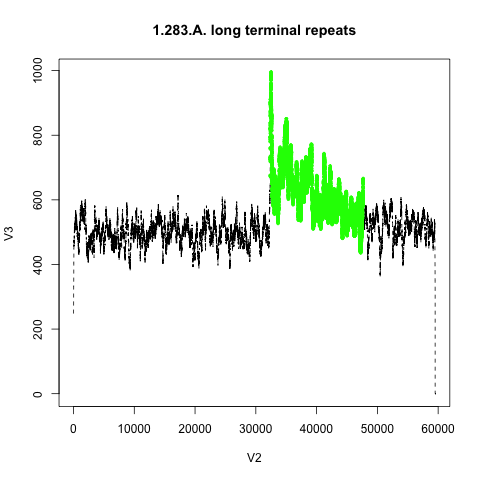

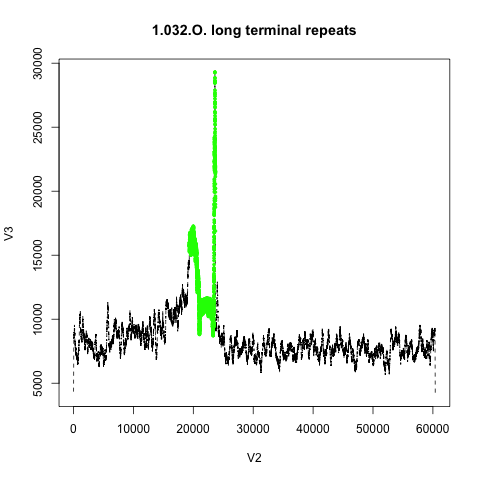

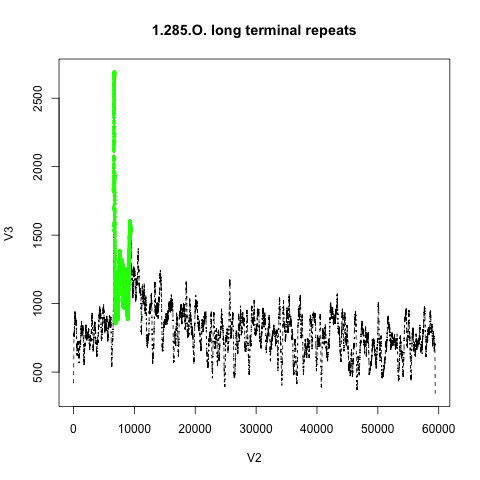

...

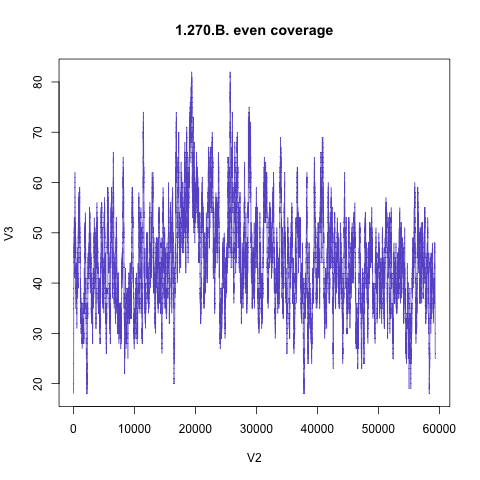

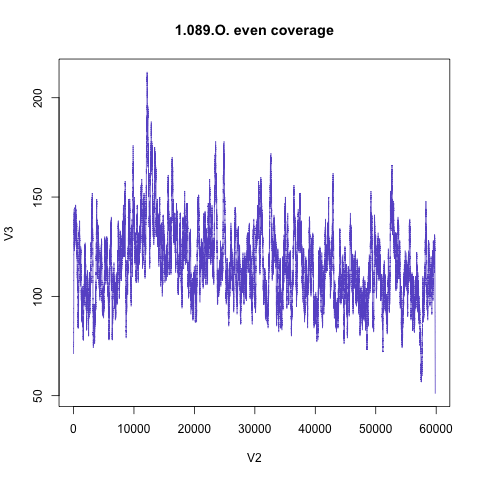

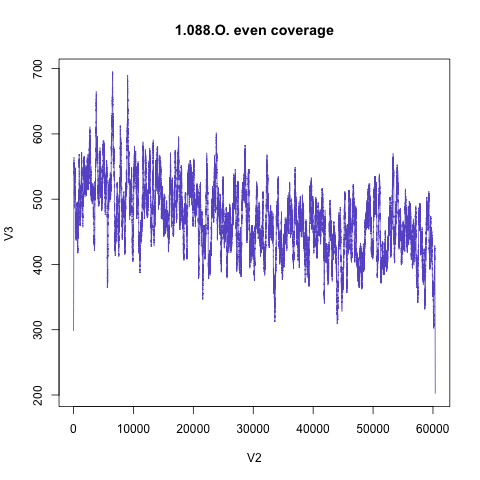

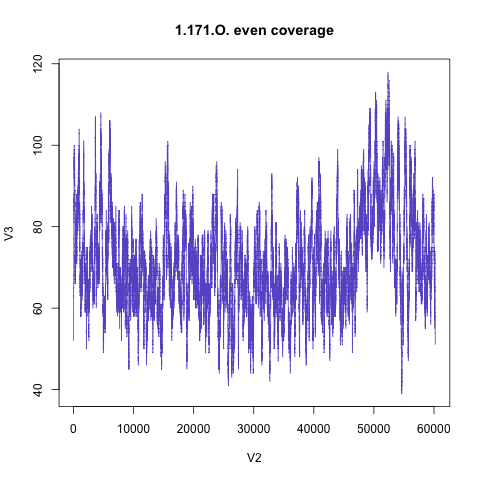

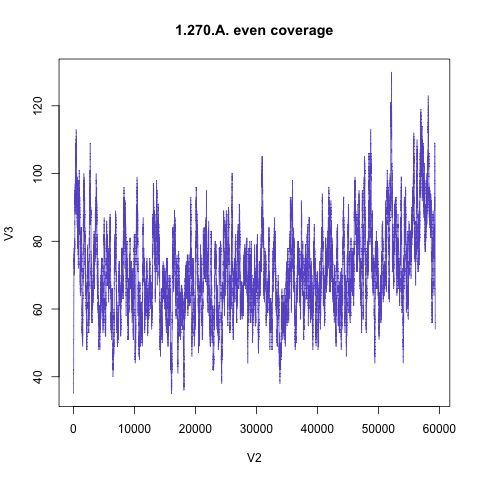

In [4]:
%%R -i grouplist
###Cos-dip phages


next_step<-vector()

cos_pattern<-vector()
cos_count<-0

cos_sd_factor=4

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
        coverage<-read.table(filename, sep="\t")

#Check for cos dip:
       
        length<-nrow(coverage)
        cos_omit_ends_cov<-coverage[(200:(length-200)),]   #excluding larger ends of the contig in this case      
        cos_below_ave<-cos_omit_ends_cov[cos_omit_ends_cov$V3<(mean(coverage$V3)-(sd(coverage$V3)*cos_sd_factor)),]
        minlocation<-0    
        if (nrow(cos_below_ave)>0){
            
            cos_below_ave$gaps<-c(diff(cos_below_ave$V2),1)
            cos_below_ave_peaks<-cos_below_ave[cos_below_ave$gaps<5,]
            size<-max(cos_below_ave_peaks$V2)-min(cos_below_ave_peaks$V2)
            if (size < 1000 & size>50){
            
             
                with(coverage, plot(V2, V3, type="n",xlab="position",ylab="coverage", main=paste(item, size, sep=" ")))
                with(coverage, lines(V2,V3))
                with(cos_below_ave, points(V2,V3, col="green",pch=19))
                cos_pattern<-c(cos_pattern,item)        #add significant minimum coverage phage contigs to list
                cos_count=cos_count+1

        } else {next_step<-c(next_step, item)}
        } else {next_step<-c(next_step,item)}
            }}

after_cos<-next_step

#mu-like phages

grouplist<-next_step
next_step<-vector()

mu<-vector()
mu_count<-0

mu_factor=5

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
         coverage<-read.table(filename, sep="\t")
         length=nrow(coverage)
         peaks<-coverage[coverage$V3>(mean(coverage$V3)+sd(coverage$V3)*mu_factor),]
         mu_size<-max(peaks$V2)-min(peaks$V2) 
                #max_peaks<-max(peaks$V2)
                #min_peaks<-min(peaks$V2)
                #mu_size<-max_peaks-min_peaks
                
                
               if (((min(peaks$V2)<500&max(peaks$V2)<500)|(min(peaks$V2)>(length-500)&max(peaks$V2)>length-500)) & mu_size<300 & (coverage$V2[coverage$V3==min(coverage$V3)]<500|coverage$V2[coverage$V3==min(coverage$V3)]>(length-500))){
                           mu_count<-mu_count+1
                           mu<-c(mu, item)
                            with(coverage, plot(V2, V3, type="l", lty=2, col="navy blue", main=paste(item, "Mu-like", sep="")))         
                            }
        else {next_step<-c(next_step, item)}
        }}
after_cos_mu<-next_step

#internal maxima
grouplist<-after_cos_mu
#grouplist<-next_step
next_step<-vector()

stretch=6
sd_factor=1

tr_candidate<-vector()
tr_start<-vector()
tr_stop<-vector()


#phages that have both an extremely high coverage peak and an extremely low coverage peak
hl<-vector()
hl_count<-0

#sip="small internal peak"
sip<-vector()
sip_start<-vector()
sip_stop<-vector()
sip_count<-0

count<-0

#create coverage plots for each genome
for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
    
    coverage<-read.table(filename, sep="\t")
    length<-nrow(coverage)
    coverage$V3_stretch<-coverage$V3^stretch
    
    coverage1<-coverage[(500:(length-500)),] 
    above_ave<-coverage1[coverage1$V3_stretch>(mean(coverage$V3_stretch)+sd(coverage$V3_stretch)*sd_factor),]
    if (nrow(above_ave)>0){
    above_ave$gaps<-c(diff(above_ave$V2),1)
    
    aamin<-min(above_ave$V2)
    aamax<-max(above_ave$V2)
    aa_region_mean<-mean(coverage[aamin:aamax,]$V3)
    all_mean<-mean(coverage$V3)
        
    size<-aamax-aamin

    #print(paste(item, paste(aamin, aamax, sep=" to "),"region coverage is", aa_region, "; total coverage is", all_mean,sep=" "))
    if(nrow(above_ave)>1 & (aa_region_mean>(all_mean+(sd(coverage$V3)*sd_factor))) & nrow(coverage)>15000){
        if (size<1000){
            above_ave$gaps<-c(diff(above_ave$V2),1)

            size<-max(above_ave$V2)-min(above_ave$V2)
            start<-min(above_ave$V2)
            stop<-max(above_ave$V2)

            length<-nrow(coverage)
            min_cov<-min(coverage$V3)
            mean_cov<-mean(coverage$V3)
            sd_cov<-sd(coverage$V3)

            #numbers needed for mu test:
            difference<-diff(coverage$V3)
            difference<-c(0,difference)
            cov1<-cbind(coverage, difference)
            length<-nrow(cov1)
            mid<-length/2
            cut_spot<-with(cov1[1:mid,], V2[which.max(difference)])
            if (cut_spot>300){cut_spot<-0}
            cut_spot2<-with(cov1[mid:length,], V2[which.min(difference)])
            if (cut_spot2<length-300){cut_spot2<-length}

            minlocation<-round(median(coverage$V2[coverage$V3==min_cov]))
            if ((minlocation>(length-1000)|minlocation<1000) & length>3000){
                    minlocation<-round(median(coverage$V2[coverage$V3[100:nrow(coverage)-100]==min(coverage$V3[100:nrow(coverage)-100])]))
                    minlocation<-round(median(coverage$V2[which.min(coverage$V3[1000:(length-1000)])]))+1000 #id location of minimum coverage that is not within 1000 bp of either terminus
                    min_cov=min(coverage$V3[1000:(length-1000)])
                }

            
                if (min_cov<mean_cov-sd_cov*2 & minlocation>(start-200) & minlocation<(start+200)) { 

                    sip<-c(sip, item)
                    with(coverage, plot(V2, V3, type="l", lty=2, col="forest green", main=paste(item, "high low", sep="")))
                    sip_count<-sip_count+1
                } 
                else {
                    sip<-c(sip, item)
                    sip_start<-c(sip_start, min(above_ave$V2))
                    sip_stop<-c(sip_stop, max(above_ave$V2))
                    with(coverage, plot(V2, V3, type="l", lty=2, col="orange", main=paste(item, "small internal coverage max", sep="")))

                    sip_count=sip_count+1
                }

            } else {

            
            tr_candidate<-c(tr_candidate, item)
            tr_start<-c(tr_start, min(above_ave$V2))
            tr_stop<-c(tr_stop, max(above_ave$V2))
            with(coverage, plot(V2, V3, type="l", lty=2, col="black", main=paste(item, "long terminal repeats", sep=" ")))
            with(coverage[aamin:aamax,], points(V2, V3, pch=19, cex=.5, col="green"))

            count=count+1

            } 
    }  else {next_step<-c(next_step, item)}
    }
    }
    }

after_cos_mu_tr<-next_step

#multiple peaks 

#grouplist<-after_cos_mu_tr
grouplist<-next_step
next_step<-vector()

stretch=5
mp_sd_factor=5

mp<-vector() #mp stands for multiple peaks
mp_count<-0


for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
        coverage<-read.table(filename, sep="\t")
        length<-nrow(coverage)


        #with(above_ave, plot(V2, gaps, col="maroon", pch=19, xlim=c(0, max(coverage$V2)), main=paste(item, size,max(gaps), sep=":")))
        coverage$V3_stretch<-coverage$V3^stretch        

        mp_omit_ends_cov<-coverage[(200:(length-200)),]   #excluding larger ends of the contig in this case
        mp_above_ave<-mp_omit_ends_cov[mp_omit_ends_cov$V3>(mean(coverage$V3)+sd(coverage$V3)*mp_sd_factor),]
    if (nrow(mp_above_ave)>0){
        
        mp_above_ave$gaps<-c(diff(mp_above_ave$V2),1)
        mp_above_ave_peaks<-mp_above_ave[mp_above_ave$gaps>2000,] 
        
        if (nrow(mp_above_ave_peaks)>0){
                with(coverage, plot(V2, V3, type="l", lty=2, col="orange", main=paste(item, nrow(mp_above_ave_peaks), sep=" ")))
                with(mp_above_ave_peaks, points(V2, V3, col="green", pch=19))
                abline(mean(coverage$V3),0, col="purple")
                abline(mean(coverage$V3)+sd(coverage$V3)*sd_factor,0, col="red")
                #with(coverage[coverage$V3>(mean(coverage$V3)+sd(coverage$V3)*sd_factor),], points(V2, V3, col="green", cex=.2, pch=19))
                mp<-c(mp, item)
                mp_count<-mp_count+1
   
        
        }else {next_step<-c(next_step, item)}}
    else {
            next_step<-c(next_step, item)}
    }
    }
after_cos_mu_tr_mp<-next_step

#headful phage test; iteration 1:

splits=c(1200,1300,1400,1500,1600,1800,2000)
mean_threshold=6

#grouplist<-next_step
grouplist<-after_cos_mu_tr_mp
next_step<-vector()

#splits=c(1400)
splitspots=vector()
coverage_shift=vector()
everything_else=vector()


headful=vector()
headful_count=0

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
    coverage<-read.table(filename, sep="\t")
    if(nrow(coverage)>max(splits)){
    #midpoint=0
    length<-nrow(coverage)
    
    for (s in splits){
        
        coverage$bins<-as.numeric(cut(coverage$V2, round(length/s)))
        bin_sum<-group_by(coverage, bins)%>%summarise(mean=mean(V3), stdev=sd(V3)) 
        bin_sum$dif<-c(abs(diff(bin_sum$mean)),0)
        threshold<-mean(bin_sum$dif)*mean_threshold
        if ((max(bin_sum$dif)>threshold) & (nrow(bin_sum[bin_sum$dif>threshold,])==1)){

            with(coverage, plot(V2,V3,main=paste(item, "binsize used was" ,s, sep=" "), type="n", ylab="Coverage", xlab="Genome"))
            with(coverage, lines(V2,V3, lty=2, col="black"))
            with(bin_sum, points(bins*s, mean, pch=19, col="forest green"))
            #with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*binsize, mean[bin_sum$dif==max(bin_sum$dif)], col="red", pch=19, cex=1.5))
            with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*s, mean[bin_sum$dif==max(bin_sum$dif)], col="purple", pch=8, cex=2))

            headful<-c(headful, item)
            headful_count<-headful_count+1
            
            #with(bin_sum, plot(bins*s, dif, main=paste(phage, 'binned by', s, "bp", sep=" "), xlab="genome",ylab="difference in mean coverage"))
            #with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*binsize, dif[bin_sum$dif==max(bin_sum$dif)], col="red", pch=19))     
            #with(bin_sum, points(bins[bin_sum$dif>threshold]*binsize, dif[bin_sum$dif>threshold], col="red", pch=8, cex=2))

            break
        } 
    }
    if (item %in% headful==FALSE){
        #with(coverage, plot(V2, V3, lty=2, col="dark grey", main=paste(phage,"no pattern yet identified", sep=" ")))
        next_step<-c(next_step, item)
    }
    
    }
    } 
    }

after_cos_mu_tr_mp_hf1<-next_step

#evenness check~round 1
grouplist<-next_step
#grouplist<-after_cos_mu_tr_mp_hf1
next_step<-vector()     

even<-vector()
even_count<-0

upper_sd_factor<-3

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
        coverage<-read.table(filename, sep="\t")
        even_above_ave<-coverage[coverage$V3>(mean(coverage$V3)+sd(coverage$V3)*upper_sd_factor),]
        
        if (nrow(even_above_ave)<10)  {
            with(coverage, plot(V2, V3, main=paste(item, "even coverage", sep=" "), type='l', col="slateblue3"))
            even<-c(even, item)
            even_count<-even_count+1

        } else {next_step<-c(next_step, item)}
        }
    }
after_cos_mu_tr_mp_hf1_even<-next_step

#headful phage test; iteration 2:


splits=c(800,1000,1200,1300,1400,1500,1600,1800,2000)
mean_threshold=5


#grouplist<-next_step
grouplist<-after_cos_mu_tr_mp_hf1_even
next_step<-vector()

#splits=c(1400)
splitspots=vector()
coverage_shift=vector()
everything_else=vector()
mean_threshold=4

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
    coverage<-read.table(filename, sep="\t")
    if(nrow(coverage)>max(splits)){
    #midpoint=0
    length<-nrow(coverage)
    
    for (s in splits){
        
        coverage$bins<-as.numeric(cut(coverage$V2, round(length/s)))
        bin_sum<-group_by(coverage, bins)%>%summarise(mean=mean(V3), stdev=sd(V3)) 
        bin_sum$dif<-c(abs(diff(bin_sum$mean)),0)
        threshold<-mean(bin_sum$dif)*mean_threshold
        if ((max(bin_sum$dif)>threshold) & (nrow(bin_sum[bin_sum$dif>threshold,])==1)){

            with(coverage, plot(V2,V3,main=paste(item, "binsize used was" ,s, sep=" "), type="n", ylab="Coverage", xlab="Genome"))
            with(coverage, lines(V2,V3, lty=2, col="black"))
            with(bin_sum, points(bins*s, mean, pch=19, col="forest green"))
            #with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*binsize, mean[bin_sum$dif==max(bin_sum$dif)], col="red", pch=19, cex=1.5))
            with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*s, mean[bin_sum$dif==max(bin_sum$dif)], col="purple", pch=8, cex=2))

            headful<-c(headful, item)
            headful_count<-headful_count+1
            
            #with(bin_sum, plot(bins*s, dif, main=paste(phage, 'binned by', s, "bp", sep=" "), xlab="genome",ylab="difference in mean coverage"))
            #with(bin_sum, points((bins[bin_sum$dif==max(bin_sum$dif)])*binsize, dif[bin_sum$dif==max(bin_sum$dif)], col="red", pch=19))     
            #with(bin_sum, points(bins[bin_sum$dif>threshold]*binsize, dif[bin_sum$dif>threshold], col="red", pch=8, cex=2))

            break
        } 
    }
    if (item %in% headful==FALSE){
        #with(coverage, plot(V2, V3, lty=2, col="dark grey", main=paste(phage,"no pattern yet identified", sep=" ")))
        next_step<-c(next_step, item)
    }
    
    }
    } 
    }

after_cos_mu_tr_mp_hf1_even_hf2<-next_step


#evenness check round 2

grouplist<-next_step
#grouplist<-after_cos_mu_tr_mp_hf1_even_hf2
next_step<-vector()     

upper_sd_factor<-5

for (item in grouplist){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
        coverage<-read.table(filename, sep="\t")
        even_above_ave<-coverage[coverage$V3>(mean(coverage$V3)+sd(coverage$V3)*upper_sd_factor),]
        
        if (nrow(even_above_ave)<10)  {
            with(coverage, plot(V2, V3, main=paste(item, "even coverage", sep=" "), type='l', col="slateblue3"))
            even<-c(even, item)
            even_count<-even_count+1

        } else {next_step<-c(next_step, item)}
        }
    }
after_cos_mu_tr_mp_hf1_even_hf2_even2<-next_step


#the rest
npd<-vector()   #npd stands for "no pattern determined"
npd_count<-0


for (item in next_step){
    filename<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    if(file.info(filename)$size>0) {
        coverage<-read.table(filename, sep="\t")
        with(coverage, plot(V2, V3, type="l", col="dark gray", lty=2))
        npd<-c(npd, item)
        npd_count<-npd_count+1
        }}


print(paste("there are", mu_count, "mu-like phages;",cos_count, "cos-like phages;", sip_count, "small internal peak phages;",sep=" "))
print(paste("there are", count, "long terminal repeat phages;", mp_count,"phages with multiple peaks;",headful_count,"headful phages;", sep=" "))
print(paste("and", even_count, "phages with even genome coverage; and",npd_count,"phages with no determined pattern",sep=" "))

In [5]:
%%R
sips<-cbind(sip, "short_internal_peak")
mus<-cbind(mu, "mu_pattern")
coses<-cbind(cos_pattern, "cos_pattern")
ltrs<-cbind(tr_candidate, "long_internal_peak")
mps<-cbind(mp, "multiple_coverage_peaks")
headfuls<-cbind(headful, "shifts_in_coverage")
evens<-cbind(even, "even_coverage")
no_patterns<-cbind(npd, "no_pattern")

groups<-list(sips,mus,coses,ltrs,mps,headfuls,evens, no_patterns)

read_cov<-data.frame(phage=character(), cov_category=character())

for (group in groups){
    if (ncol(group)>1){
    colnames(group)<-c("phage", "cov_category")
    read_cov<-rbind(read_cov, group)
}}
head(read_cov)

     phage        cov_category
1 1.024.O. short_internal_peak
2 1.251.O.  long_internal_peak
3 1.283.A.  long_internal_peak
4 1.032.O.  long_internal_peak
5 1.285.O.  long_internal_peak
6 1.033.O.  long_internal_peak


###*Looking at the relationship between coverage assignment and genome relatedness:*

In [6]:
%R library(dplyr);library(ggplot2);library(magrittr); library(gplots); library(dendextend); library(RColorBrewer); library(colorspace)


Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess


Welcome to dendextend version 0.18.3

Type ?dendextend to access the overall documentation and
vignette('dendextend') for the package vignette.
You can execute a demo of the package via: demo(dendextend)

More information is available on the dendextend project web-site:
https://github.com/talgalili/dendextend/

Contact: <tal.galili@gmail.com>
Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues

			To suppress the this message use:
			suppressPackageStartupMessages(library(dendextend))


Attaching package: ‘dendextend’

The following object is masked from ‘package:magrittr’:

    %>%

The following object is masked from ‘package:dplyr’:

    %>%

The following object is masked from ‘package:stats’:

    cutree



array(['colorspace', 'RColorBrewer', 'dendextend', 'gplots', 'magrittr',
       'ggplot2', 'dplyr', 'tools', 'stats', 'graphics', 'grDevices',
       'utils', 'datasets', 'methods', 'base'], 
      dtype='|S12')

[1] "done"


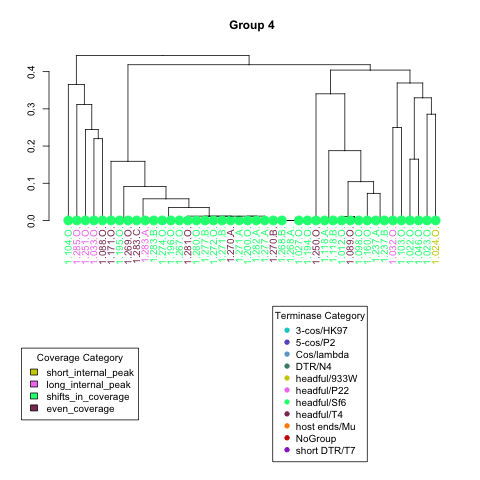

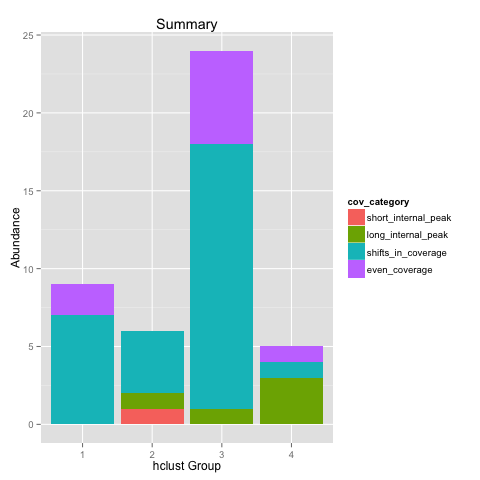

In [7]:
%%R -i group_number

palette(c("springgreen1", "violet","hotpink4","yellow3","darkorange","aquamarine4","skyblue3","red3","slateblue","darkorchid","cyan3","gray","black","brown"))
group_colors<-function(group_list) {
    n<-nrow(group_list)
    color_assignments<-cbind(group_list, rainbow_hcl(n, c = 50, l = 70, start = 0, end = 360*(n-1)/n, gamma = NULL, fixup = TRUE, alpha = 1))
    #color_assignments<-cbind(group_list, sequential_hcl(n, h = 260, c. = c(80, 0), l = c(30, 90), power = 1.5, gamma = NULL, fixup = TRUE, alpha = 1))
    #color_assignments<-cbind(group_list, colorlist[1:n])
    colnames(color_assignments)<-c("category","color")
    return(color_assignments)
}


#looking into the relatedness of group members 

blast<-read.table("/Users/jmb/Desktop/ViralFate/phage_v_phage_blast_info.txt", sep="\t")
phage_grps<-read.table("/Users/jmb/Desktop/ViralFate/PhageGenomeAssembly/phage_by_group.txt")

#group_number<-1
i<-paste('CNSv2.0:',group_number, sep="")

#colors
grps_list<-group_by(phage_grps, V2)%>%summarise(.)
#terminase<-read.table("/Users/jmb/Desktop/ViralFate/ProtComparisons/terminase_categories.txt", sep="\t", header=FALSE)
terminase<-read.table("/Users/jmb/Desktop/ViralFate/Terminase/new_terminase_categories.txt", sep="\t", header=FALSE)

terminase_colors<-group_by(terminase, V3)%>%summarise()%>%group_colors()
terminase$term_color<-terminase_colors$color[match(terminase$V3, terminase_colors$category)]
colnames(terminase)[1]<-"phage"

cov_colors<-group_by(read_cov, cov_category)%>%summarise(.)%>%group_colors()
read_cov$cov_color<-cov_colors$color[match(read_cov$cov_category, cov_colors$category)]
print("done")

#make data matrix of specific group to look at (group i)

data<-filter(blast, t_grp==i, q_grp==i)
#print(paste(i, nrow(data), sep=":"))
shared<-group_by(data, q_phage, t_phage)%>%summarise(.,sim=1-n()/(median(t_num_orfs)))
shared$sim[shared$q_phage==shared$t_phage]<-0

new_mat<-group_by(data, t_phage)%>%summarise(.)%>%.[,1]
phage<-new_mat$t_phage
    
for (member in phage){
    add<-filter(shared, q_phage==member)[c(2,3)]
    colnames(add)[2]<-member
    new_mat<-merge(new_mat, add, by="t_phage", all.x=TRUE)

}

new_mat[is.na(new_mat)]<-1
new_mat[new_mat<0]<-0
rownames(new_mat)<-new_mat$t_phage
new_mat$t_phage<-NULL

d<-new_mat %>% as.dist %>% hclust %>% as.dendrogram

div<-cutree(d, k = NULL, h = 0.4)
division<-data.frame(div)
division$phage<-rownames(division)

division_colors<-data.frame(div)%>%group_by(div)%>%summarise()%>%group_colors()

k_val<-data.frame(div)%>%group_by(div)%>%summarise()%>%nrow

division$div_col<-division_colors$color[match(division$div, division_colors$category)]

#definining potential colors

terminase_cols<-as.numeric(terminase$term_color[match(labels(d),terminase$phage)])
read_cov_cols<-as.numeric(read_cov$cov_color[match(labels(d),read_cov$phage)])
div_cols<-as.numeric(division$div_col[match(labels(d),division$phage)])

#read_coverage_pattern_colors<-read_coverage_pattern_colors[order.dendrogram(dend)]

#plot hclust with leaves colored by read coverage pattern, marked by terminase type and boxed by hclust threshold

layout(matrix(c(1,1,2,3),2,2,byrow=TRUE), widths=c(10, 20), heights=c(15, 10))
d %>% set("labels_colors", read_cov_cols) %>% set("labels_colors", read_cov_cols)%>%set("leaves_pch",19)%>%set("leaves_col",terminase_cols)%>%set("leaves_cex",2)%>%plot(main=(paste("Group", group_number))) 
#if(k_val>1){
#    d %>% rect.dendrogram(k=k_val, border="gray", lty=2, lwd=3, lower_rect=-0.15)
#    }
par(mar=c(0,0,0,0))
plot.new()
legend("center",legend = cov_colors$category, fill = cov_colors$color, title="Coverage Category")
plot.new()
legend("center",legend = terminase_colors$category, col = terminase_colors$color, pch=19, title="Terminase Category")


#d %>% set("labels_colors", terminase_cols) %>% plot(main="terminase colors")
#legend("topleft", legend = terminase_colors$category, fill = terminase_colors$color)

#d %>% set("labels_colors", div_cols) %>% plot(main="hclust division colors")
#legend("topleft", legend = division_colors$category, fill = division_colors$color)

all<-merge(read_cov, terminase, by="phage", all.x=TRUE)%>%merge(.,division, by="phage") %>% ggplot(., aes(x=as.character(div), fill=cov_category)) + geom_bar() + labs(x="hclust Group", y="Abundance", title="Summary")

plot(all)


**The terminase data says that this particular group of phages all resemble p22-like phages.  The patterns that come up all are in the realm of possibility of being headful phages, I'm going to treat these as headful phages.**

##*If phages are suspected to be headful:*

In [14]:
groupfile=grouplist
out=open("headful_ops.sh","w")
out.write("#!/bin/bash\n#SBATCH -n 16\n#SBATCH -N 1\n#SBATCH -o prodigal.out\n#SBATCH -e prodigal.err\n#SBATCH -p sched_mit_hill\n\n")
out.write("module add engaging/prodigal/2.6.1\n\n")
out.write("module add engaging/ncbi-blast/2.2.30+\n\n")
for line in groupfile:
    out.write("prodigal -i "+line+"step1.contig1.fasta -o "+line+"genes -a "+line+"proteins.faa -p meta\n")


    
for line in groupfile:
    inputfasta=line+"proteins.faa"
    bout1=line+"prodprot.vs.lg.terminases.txt"
    #bout2=line+"prodprot.vs.sm.terminases.txt"
    blastcommand="blastp -db /nobackup1/jbrown/blast_db/terminase_lg_subunit.fasta -query "+inputfasta+" -num_descriptions 1 -evalue 0.00001 -outfmt 6 -out "+bout1
    #blastcommand2="blastx -db /nobackup1/jbrown/blast_db/terminase_sm_subunit.fasta -query "+inputfasta+" -num_descriptions 1 -outfmt 6 -out "+bout2
    out.write(blastcommand+"\n")#+blastcommand2+"\n\n")
out.close()
!open headful_ops.sh -a textedit
!scp headful_ops.sh jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/ 

headful_ops.sh                                100%   12KB  11.8KB/s   00:00    


*Run headful_ops.sh on MIT server, then:

In [15]:
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/*genes ./
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/*vs.lg.terminases.txt ./    

1.012.O.genes                                 100%   23KB  23.3KB/s   00:00    
1.022.O.genes                                 100%   23KB  23.0KB/s   00:00    
1.023.O.genes                                 100%   22KB  21.6KB/s   00:00    
1.024.O.genes                                 100%   20KB  20.1KB/s   00:00    
1.027.O.genes                                 100%   21KB  20.8KB/s   00:00    
1.032.O.genes                                 100%   22KB  22.5KB/s   00:00    
1.033.O.genes                                 100%   22KB  21.6KB/s   00:00    
1.046.O.genes                                 100%   22KB  21.8KB/s   00:00    
1.088.O.genes                                 100%   21KB  21.4KB/s   00:00    
1.089.O.genes                                 100%   23KB  22.8KB/s   00:00    
1.098.O.genes                                 100%   23KB  23.4KB/s   00:00    
1.103.O.genes                                 100%   22KB  22.0KB/s   00:01    
1.104.O.genes                           

In [16]:
#treat just like group4 phages:
from Bio.Seq import Seq
import os.path


startpoint=""
for phage in grouplist:
    if os.path.exists(phage+"genes"):
        #Create dictionary of identity and location of prodigal calls for phage genome
        gene_tbl=open(phage+"genes").readlines()     #open prodigal gene table for phage genome
        loc=[]
        nam=[]
        for line in gene_tbl[2:]:
            here=line.split()
            if here[0]=="CDS":
                loc.append(here[1])
            else:
                info=here[0].split(";")
                there=info[0].split("=")
                if len(there)==3:
                    nam.append("contig_"+there[2])
        dict1=dict(zip(nam,loc))                  #create dictionary of the location of each orf by prodigal-assigned name
        blast=open(phage+"prodprot.vs.lg.terminases.txt").readlines() 
        terminase_hits=[]
        e_values=[]
        best_evalue=1
        best_e_line=""
        for line in blast:
            if line.split("\t")[0] not in terminase_hits:
                terminase_hits.append(line.split("\t")[0])
                e_values.append(line.split("\t")[10])  

            if float(line.split("\t")[10])<best_evalue:
                best_evalue=float(line.split("\t")[10])
                orf=line.split("\t")[0]

        value=dict1[orf]                                                    #pull out location of BLAST-identified terminase
        if value.startswith("complement"):                                  #determine orientation of orf and
            adjust=orf.split("_")                                           #identification of start of gene upstream of terminase large subunit
            orientation="reverse"
            key2=adjust[0]+"_"+adjust[1]+"_"+str(int(adjust[2])+1)
            value2=dict1.get(key2,0)
            if dict1.get(key2,0)!=0:                                           

                vec1=value2.split("(")
                vec2=vec1[1].split("..")
                start=vec2[1]
                stop=vec2[0]

            else:
                print("end of contig reverse")
                key2=adjust[0]+"_"+adjust[1]+"_1"
                orientation="reverse"
                value2=dict1.get(key2,"end of contig")
                vec1=value2.split("(")
                vec2=vec1[1].split("..")
                start=vec2[0]
                stop=vec2[1]

        else:
            adjust=orf.split("_")
            key2=adjust[0]+"_"+adjust[1]+"_"+str(int(adjust[2])-1)
            orientation="forward"
            if dict1.get(key2,0)!=0:
                value2=dict1.get(key2,"end of contig")
                vec2=value2.split("..")
                start=vec2[0]
                stop=vec2[1]      
            else:
                print("end of contig forward")
                orf_num=len(dict1)
                key2=adjust[0]+"_"+adjust[1]+"_"+str(orf_num)
                if ">" in dict1.get(key2,0):
                    key2=adjust[0]+"_"+adjust[1]+"_"+str(orf_num-1)
                value2=dict1.get(key2, 0)
                vec2=value2.split("..")
                start=vec2[0]
                stop=vec2[1]
        start=start.replace(">","").replace(")","").replace("<","")
        stop=stop.replace(">","").replace(")","").replace("<","")
        
        fastafile=phage+"step1.contig1.fasta"
        f=open(fastafile)                                       #open fasta file
        sequence=""
        for row in f:                           #define title and sequences
            if row.startswith(">"):
                title=row
            else:
                sequence+=row
        sequence=sequence.replace("\n","")
        outfile=open(phage+"step1.contig1.rearrange.fasta","w")
        if start!=0:
            
            upstream=sequence[0:int(start)-1]                    #id sequence before start of small subunit terminase
            downstream=sequence[int(start)-1:]                   #id sequence after start of small subunit terminase 
            rearrange=downstream+upstream                        #re-arrange contigs so that small subunit terminase start is at end of contig
            print(phage+":"+str(len(sequence))+":"+str(len(rearrange))+":"+str(start))
            if orientation=="reverse":                           #reverse-complement the genome if terminase gene is in reverse orientation
                seq=Seq(rearrange)
                out_seq=seq.reverse_complement()
                outfile.write(">"+phage+"\n"+str(out_seq))
                startpoint=startpoint+phage+"\t"+str(int(start))+"\n"
            else:
                outfile.write(">"+phage+"\n"+rearrange)
                startpoint=startpoint+phage+"\t"+str(len(seq)-int(start))+"\n"
        outfile.close()
        print(phage+" done!")
    else:
        print(phage+" sequence file does not exist")

1.237.B.:60160:60160:36736
1.237.B. done!
1.267.O.:59414:59414:17571
1.267.O. done!
1.196.O.:59414:59414:9946
1.196.O. done!
1.195.O.:59738:59738:10945
1.195.O. done!
1.277.A.:59297:59297:3382
1.277.A. done!
1.104.O.:60990:60990:706
1.104.O. done!
1.271.B.:59297:59297:52102
1.271.B. done!
1.118.B.:60458:60458:16733
1.118.B. done!
1.200.O.:59297:59297:12184
1.200.O. done!
1.281.O.:59297:59297:12325
1.281.O. done!
1.012.O.:59979:59979:43862
1.012.O. done!
1.194.O.:59294:59294:49447
1.194.O. done!
1.269.O.:59738:59738:6394
1.269.O. done!
1.027.O.:59297:59297:12457
1.027.O. done!
1.046.O.:62503:62503:14323
1.046.O. done!
end of contig reverse
1.250.O.:59983:59983:3
1.250.O. done!
1.272.O.:59297:59297:33064
1.272.O. done!
1.270.B.:59294:59294:22679
1.270.B. done!
1.089.O.:59851:59851:13701
1.089.O. done!
1.088.O.:60385:60385:5946
1.088.O. done!
1.274.O.:59409:59409:10976
1.274.O. done!
1.271.A.:59297:59297:53771
1.271.A. done!
end of contig forward
1.023.O.:59872:59872:56706
1.023.O. done!


In [9]:
!scp *step1.contig1.rearrange.fasta jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/

1.012.O.step1.contig1.rearrange.fasta         100%   59KB  58.6KB/s   00:00    
1.022.O.step1.contig1.rearrange.fasta         100%   61KB  61.0KB/s   00:00    
1.023.O.step1.contig1.rearrange.fasta         100%   58KB  58.5KB/s   00:00    
1.024.O.step1.contig1.rearrange.fasta         100%   58KB  57.5KB/s   00:00    
1.027.O.step1.contig1.rearrange.fasta         100%   58KB  57.9KB/s   00:00    
1.032.O.step1.contig1.rearrange.fasta         100%   59KB  59.0KB/s   00:00    
1.033.O.step1.contig1.rearrange.fasta         100%   60KB  59.8KB/s   00:00    
1.046.O.step1.contig1.rearrange.fasta         100%   61KB  61.1KB/s   00:00    
1.088.O.step1.contig1.rearrange.fasta         100%   59KB  59.0KB/s   00:00    
1.089.O.step1.contig1.rearrange.fasta         100%   58KB  58.5KB/s   00:00    
1.098.O.step1.contig1.rearrange.fasta         100%   58KB  58.5KB/s   00:00    
1.103.O.step1.contig1.rearrange.fasta         100%   60KB  60.3KB/s   00:00    
1.104.O.step1.contig1.rearrange.fasta   

###*Finishing re-arranged/manipulated assemblies*

In [12]:
script=open("rearrange_recruitment.slurm","w")
script.write("#!/bin/bash\n#SBATCH -n 16\n#SBATCH -N 1\n#SBATCH -o rearrange.out\n#SBATCH -e rearrange.err\n#SBATCH -p sched_mit_chisholm\n\n")
script.write("module add engaging/clc-assembly-cell\nmodule add engaging/samtools/1.1\nmodule add engaging/bedtools/2.22.1\n\n")

groupfile=grouplist
for virus in groupfile:
    target_seq=virus+"step1.contig1.rearrange.fasta"
    reads="../"+virus+"*.fastq"
    recruitfile=virus+"s1c1.rearrange.cas"
    outputfasta=virus+"recruit2.fasta"
    directed=virus+"rearrange."

    script.write("clc_mapper -o "+recruitfile+" -p fb ss 100 300 -q "+reads+" -d "+target_seq+" -a local -r ignore \n")
    script.write("clc_extract_consensus -z none -a "+recruitfile+" -o "+outputfasta+"\n")
    script.write("clc_cas_to_sam -a "+recruitfile+" -o "+directed+"bam\n")
    script.write("samtools sort "+directed+"bam "+directed+"sorted\n")
    script.write("samtools index "+directed+"sorted.bam\n")
    script.write("bedtools genomecov -ibam "+directed+"sorted.bam -d > "+directed+"genomecoverage.txt\n\n")

script.close()
!open rearrange_recruitment.slurm -a textedit
!scp rearrange_recruitment.slurm jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4

rearrange_recruitment.slurm                   100%   22KB  21.7KB/s   00:00    


In [13]:
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/*.recruit2.fasta ./
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/*.rearrange.genomecoverage.txt ./

1.012.O.recruit2.fasta                        100%   60KB  59.6KB/s   00:00    
1.022.O.recruit2.fasta                        100%   62KB  62.0KB/s   00:00    
1.023.O.recruit2.fasta                        100%   59KB  59.5KB/s   00:00    
1.024.O.recruit2.fasta                        100%   58KB  58.5KB/s   00:00    
1.027.O.recruit2.fasta                        100%   59KB  58.9KB/s   00:00    
1.032.O.recruit2.fasta                        100%   60KB  60.0KB/s   00:00    
1.033.O.recruit2.fasta                        100%   61KB  60.8KB/s   00:00    
1.046.O.recruit2.fasta                        100%   62KB  62.1KB/s   00:01    
1.088.O.recruit2.fasta                        100%   60KB  60.0KB/s   00:00    
1.089.O.recruit2.fasta                        100%   59KB  59.4KB/s   00:00    
1.098.O.recruit2.fasta                        100%   59KB  59.4KB/s   00:00    
1.103.O.recruit2.fasta                        100%   61KB  61.3KB/s   00:01    
1.104.O.recruit2.fasta                  

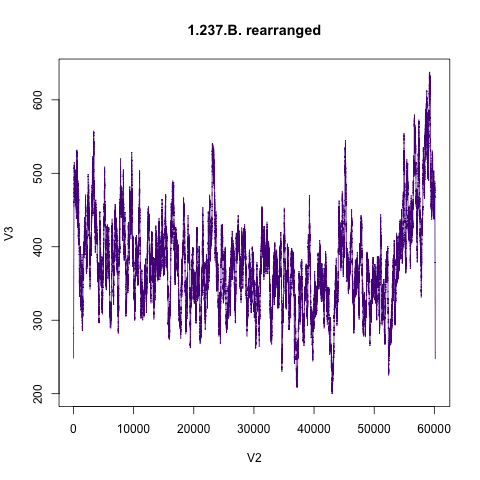

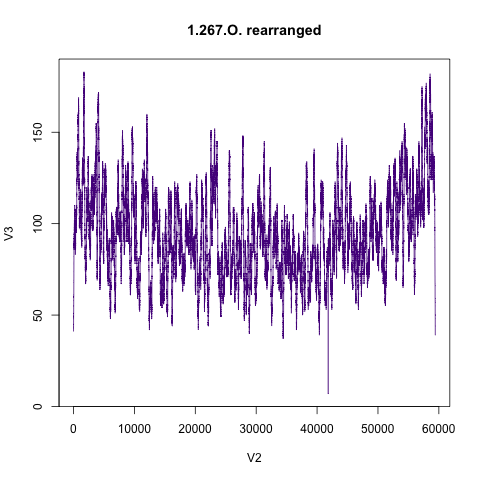

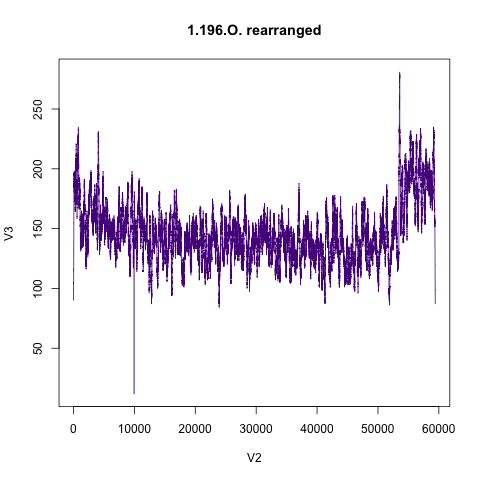

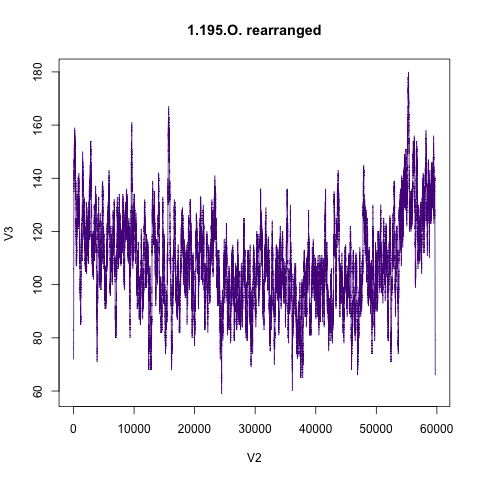

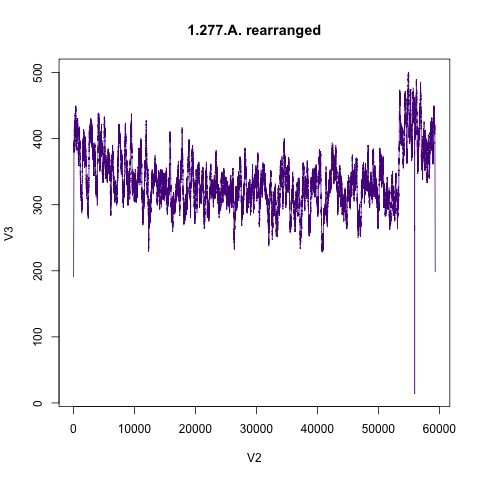

...

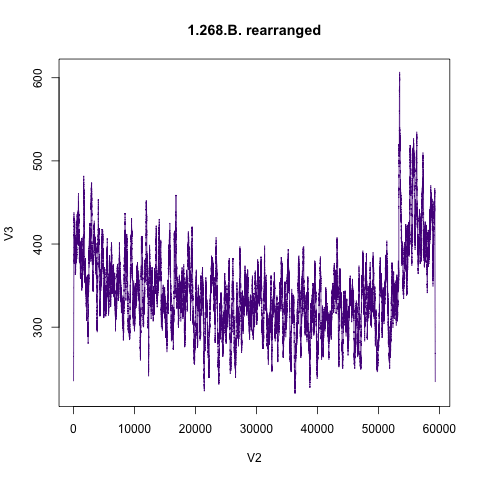

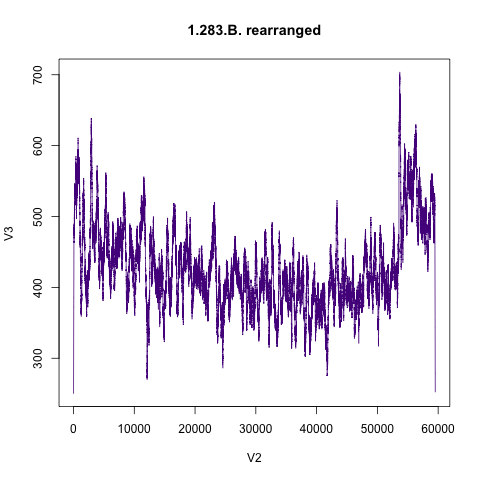

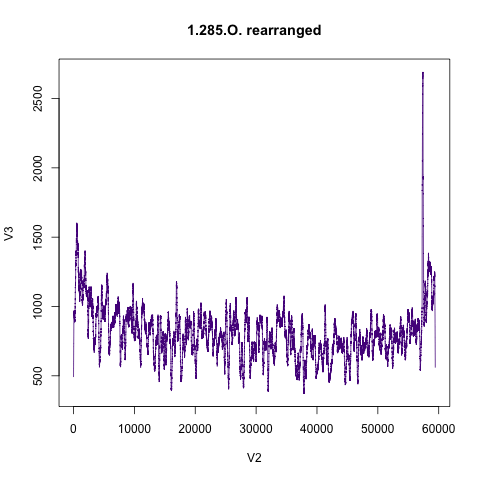

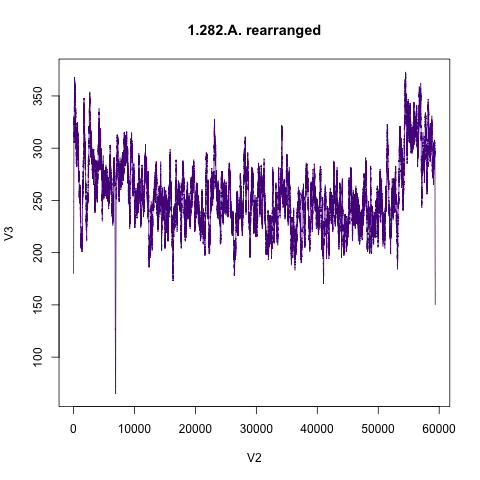

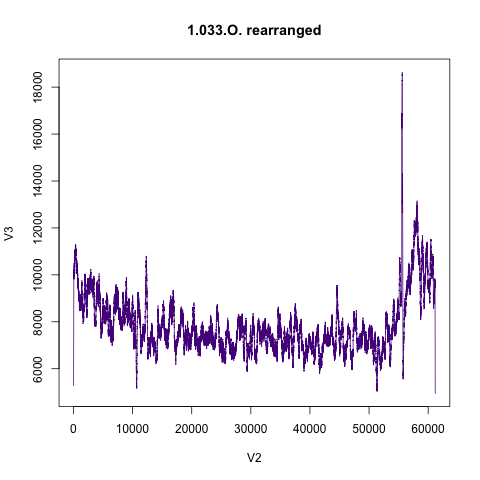

In [14]:
%%R -i grouplist

for (item in grouplist){
    filename<-paste(item,"rearrange.genomecoverage.txt",sep="")
    coverage<-read.table(filename, sep="\t")
    with(coverage, plot(V2, V3, type="l", col="purple4", cex=2, main=paste(item,"rearranged", sep=" ")))
}

###*Re-orientation to have terminase gene toward the start of the contig:*
>not required for headful phages.. but it's a good check to see if the re-arrangement behaved as it should

In [17]:
out=open("blast_terminase_commands.sh","w")

out.write("#!/bin/bash\n")
out.write("#SBATCH -n 16\n#SBATCH -N 1\n#SBATCH -o terminase_blast.out\n#SBATCH -e terminase_blast.err\n#SBATCH -p sched_mit_chisholm\n\n")

out.write("module add engaging/ncbi-blast/2.2.30+\n\n")

for line in grouplist:
    name=line.rstrip("\n")
    inputfasta=name+"s1c1.rearrange.fasta"
    blastoutputname=name+"vs.terminases.txt"
    blastcommand="blastx -db /nobackup1/jbrown/blast_db/NCBI_phage_terminases_20150414.fasta -query "+inputfasta+" -num_descriptions 1 -outfmt 6 -out "+blastoutputname
    out.write(blastcommand+"\n")
out.close()
!open blast_terminase_commands.sh -a textedit

In [18]:
!scp blast_terminase_commands.sh jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/

blast_terminase_commands.sh                   100% 7740     7.6KB/s   00:00    


In [19]:
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/nahant_phage_reads/group4/*vs.terminase.txt ./

scp: /nobackup1/jbrown/nahant_phage_reads/group4/*vs.terminase.txt: No such file or directory


In [ ]:
from pyfaidx import Fasta

for line in grouplist:
    name=line.rstrip("\n")
    
    blastoutputname=name+"vs.terminases.txt"
    blastout=open(blastoutputname)
    blastout=blastout.read()
    vec=blastout.split("\t")
    if len(vec)>2:
        start=int(vec[6])
        inputfasta=name+"recruit2.fasta"
        f=Fasta(inputfasta)
        viromelen=len(f[0])
        threshhold=len(f[0])/2
        sequence=str(f[0])
        seq=Seq(str(sequence))
        outfasta=open(name+"oc.fasta","w")
        outfasta.write(">"+name+"\n")

        if start>threshhold:
            print(name+": must reverse sequence ")
            out_seq=seq.reverse_complement()
    
        else:
            print(name+": sequence is in correct orientation")
            out_seq=seq
        outfasta.write(str(out_seq))
        outfasta.close()
    else:
        print(name+": no blast match")

In [6]:
from pyfaidx import Fasta

allfastqs=open("/Users/jmb/Desktop/ViralFate/PhageGenomeAssembly/allfastq.txt")   #set up name dict of original names:
name_dict={}            
for lin in allfastqs.readlines():
    phage=lin.split("_")[0]
    name=lin.split(".f")[0]
    name_dict[phage]=name


for element in grouplist:         #create final fasta file with original name as phage fasta name
    fullname=name_dict[element]
    filename=element+"recruit2.fasta"
    f=Fasta(filename)
    sequence=str(f[0])
    output=open(element+"final.fasta","w")
    output.write(">Vibriophage_"+fullname+"\n"+sequence)
    output.close()

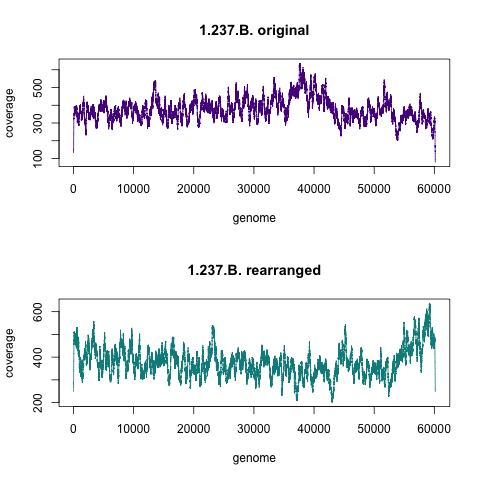

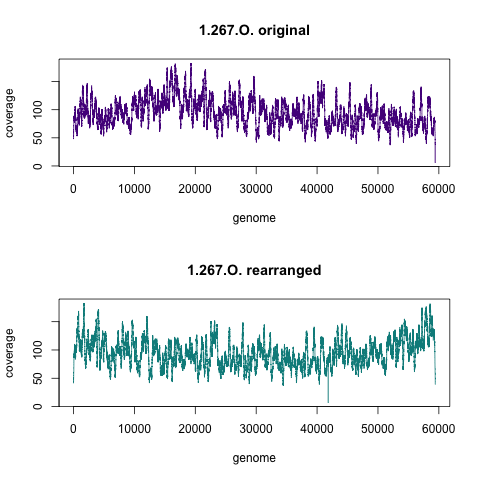

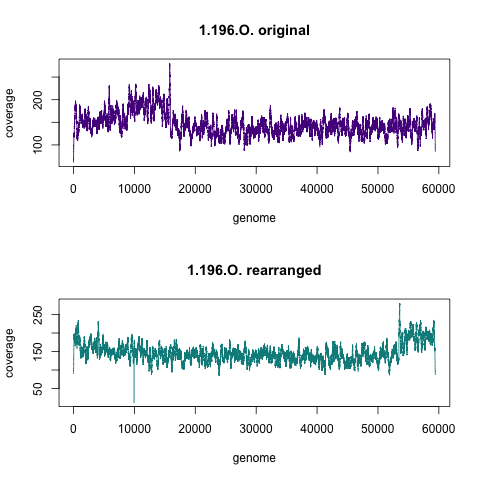

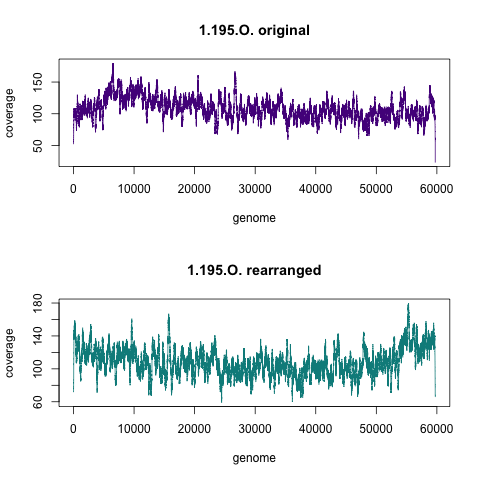

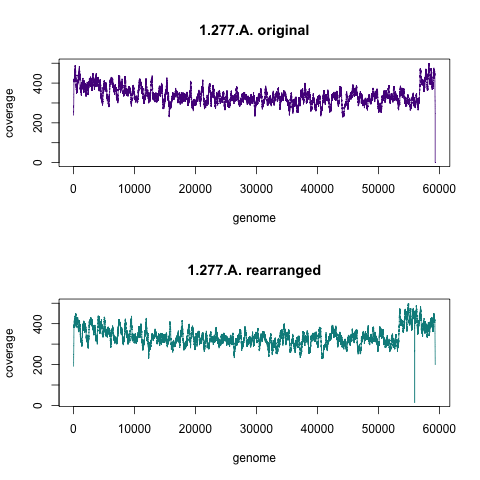

...

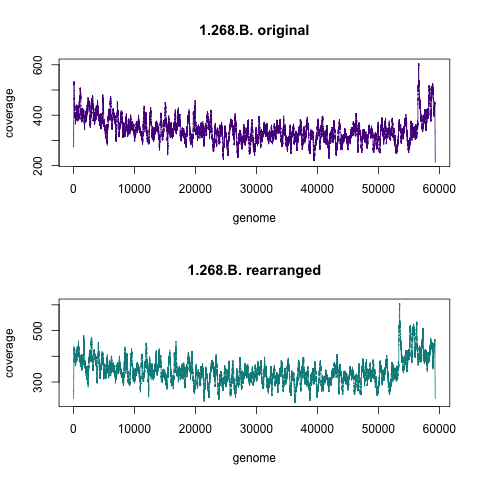

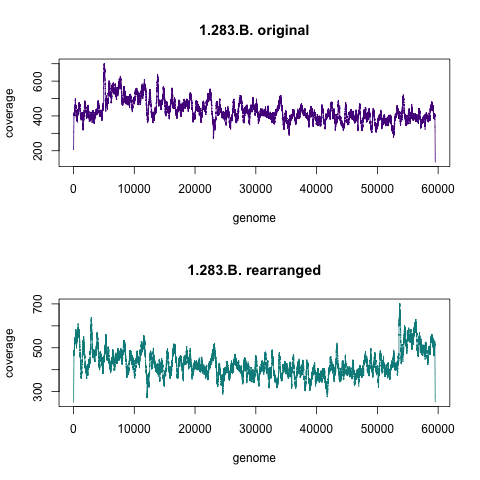

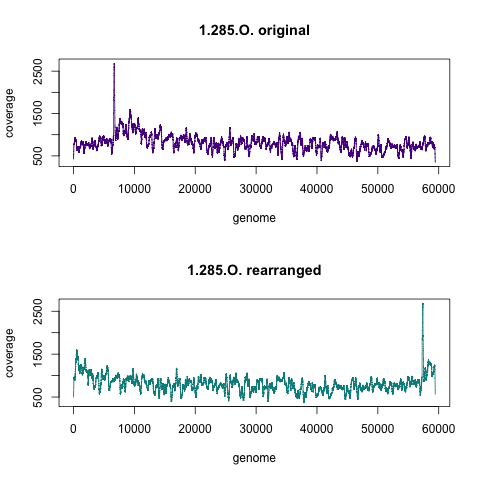

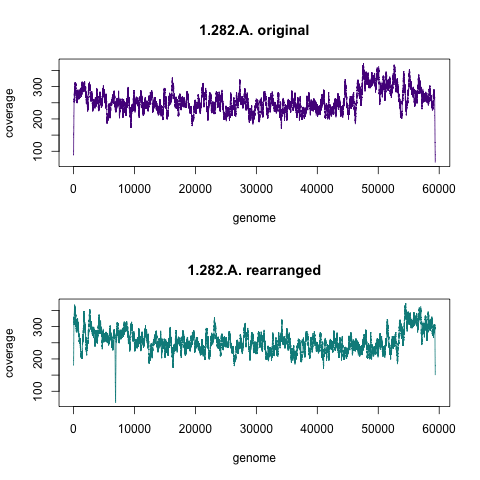

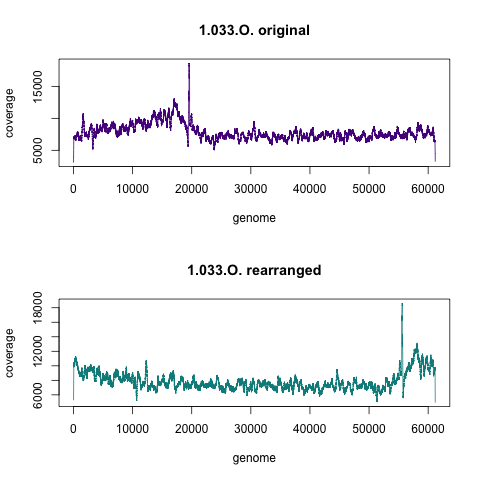

In [12]:
%%R -i grouplist

for (item in grouplist){
    layout(matrix(c(1,2),2,1,byrow=TRUE))
    filename2<-paste(item,"rearrange.genomecoverage.txt",sep="")
    filename1<-paste(item,"step1.contig1.genomecoverage.txt",sep="")
    coverage2<-read.table(filename2, sep="\t")
    coverage1<-read.table(filename1, sep="\t")
    with(coverage1, plot(V2, V3, type="l", col="purple4", cex=2, main=paste(item,"original", sep=" "), xlab="genome",ylab="coverage"))
    with(coverage2, plot(V2, V3, type="l", col="cyan4", cex=2, main=paste(item,"rearranged", sep=" "), xlab="genome",ylab="coverage"))
}


In [ ]:
%%bash
